In [264]:
#all necessary modules 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.offline as py
import numpy as np
import seaborn as sns
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.metrics import mean_squared_log_error, mean_squared_error, mean_absolute_error
from statsmodels.regression.linear_model import OLS
from statsmodels.tsa.arima_model import ARIMA
import itertools
import warnings
from statsmodels.tsa.seasonal import seasonal_decompose 
from fbprophet import Prophet
from fbprophet.plot import plot_plotly
py.init_notebook_mode()
from fbprophet.diagnostics import cross_validation, performance_metrics

In [163]:
#import data 
temp=pd.read_csv('ECA_blended_custom/TG_STAID002759.txt', skiprows=20, names=['SOUID', 'DATE', 'TG', 'Q_TG'], 
                 dtype={'SOUID':'int64', 'TG':'int64','Q_TG':'int64'})
temp=temp.set_index(pd.to_datetime(temp.DATE, format='%Y%m%d', errors='ignore')).drop('DATE', axis=1)
temp=temp['1946':]
temp['month']=temp.index.month_name()
temp.head()

,SOUID,TG,Q_TG,month
DATE,,,,
1946-01-01,127488,-34,0,January
1946-01-02,127488,-30,0,January
1946-01-03,127488,-28,0,January
1946-01-04,127488,-27,0,January
1946-01-05,127488,14,0,January


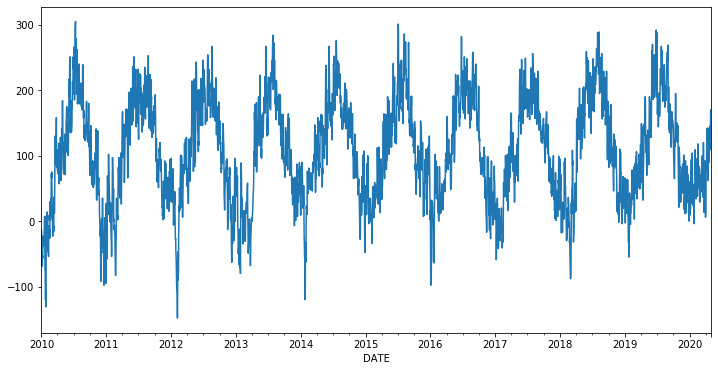

In [164]:
#quick look at TG
temp['TG']['2010':].plot(figsize=(12,6))

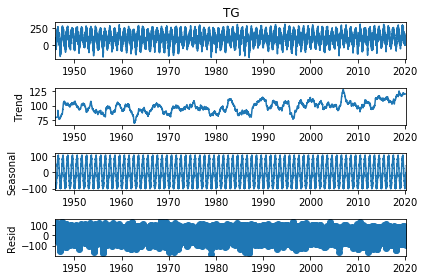

In [165]:
sdr=seasonal_decompose(temp['TG'], model='additive', extrapolate_trend='freq', freq=365)
sdr.plot()
None

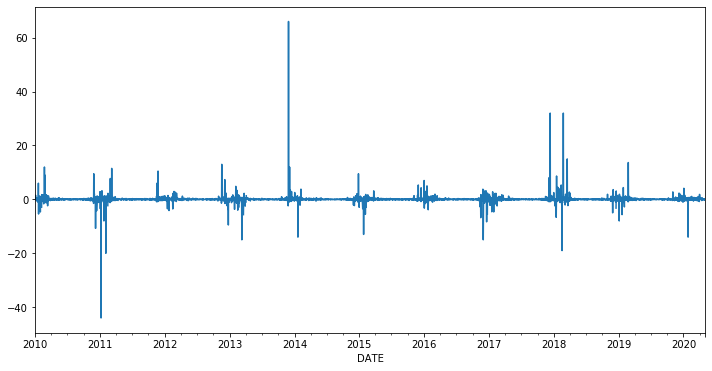

In [166]:
#take a look at percent change 
temp['pctChange']=temp['TG'].pct_change()
temp['pctChange']['2010':].plot(figsize=(12,6))

### Stationarizing data

#### removing trend

In [167]:
temp['diff']=temp['TG'].diff()

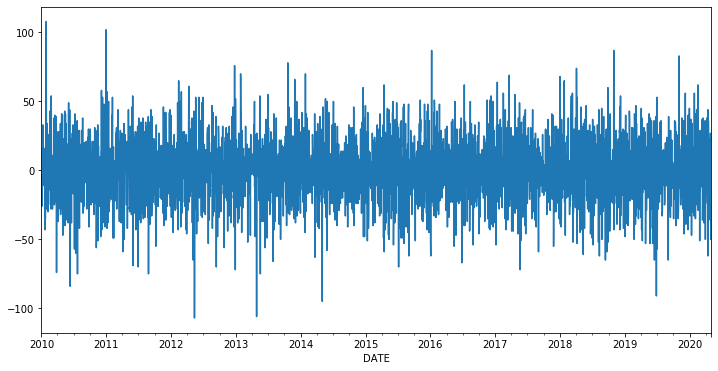

In [168]:
temp['diff']['2010':].plot(figsize=(12,6))

In [169]:
temp['diff2']=temp['diff'].diff()

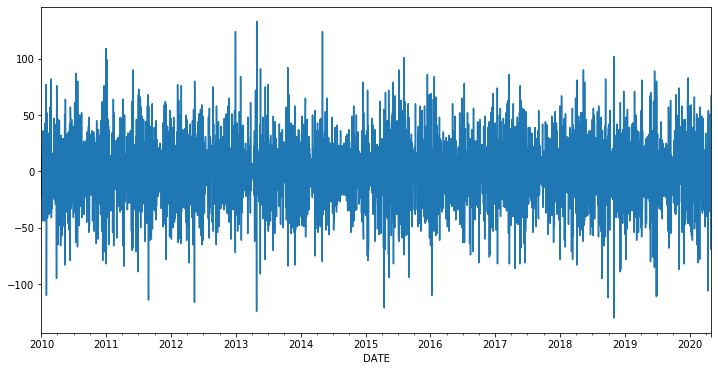

In [170]:
temp['diff2']['2010':].plot(figsize=(12,6))

**doesn't appear to be any variance in data**

#### remove seasonality 

In [171]:
temp['monthlyMean']=temp.groupby('month')['diff2'].transform('mean')
temp['deseason']=temp['diff2']-temp['monthlyMean']

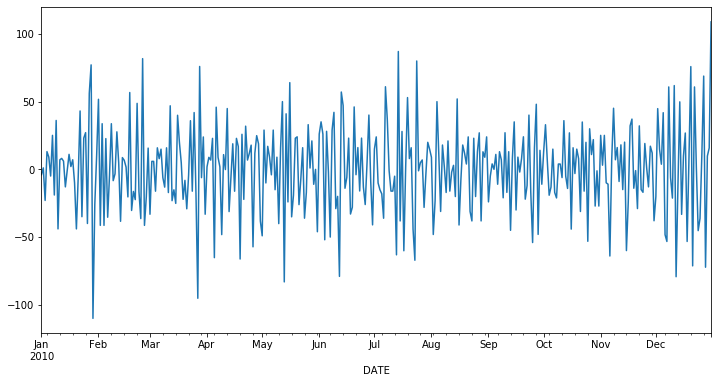

In [172]:
temp['deseason']['2010'].plot(figsize=(12,6))

#### Create lag to define P

In [173]:
for i in range(1,10):
    temp[f'{i}shiftSeason']=temp['deseason'].shift(i)
temp=temp.fillna(method='bfill')    

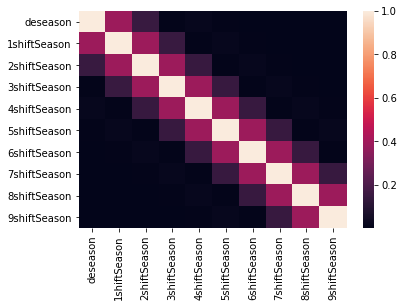

In [174]:
sns.heatmap(temp.drop([x for x in temp.columns if 'eason' not in x], axis=1).corr().abs())

#### Determining ARIMA model parameters 

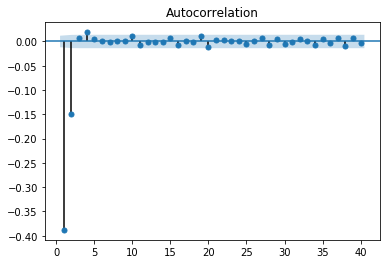

In [175]:
plot_acf(temp['deseason'], lags=list(range(1,41)))
None

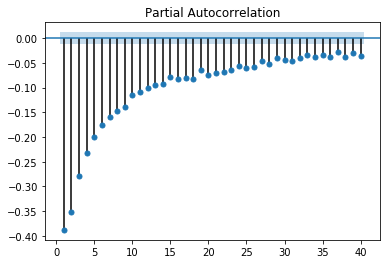

In [176]:
#helps determine which time lags should incorporate into prediction 
plot_pacf(temp['deseason'], lags=list(range(1,41))) 
None

## Split into Train and Test Split

In [260]:
##train/test split
xTrain=temp[['1shiftSeason', '2shiftSeason', '3shiftSeason']][:'20200401']
xTest=temp[['1shiftSeason', '2shiftSeason', '3shiftSeason']]['20200401':]
yTrain=temp['deseason'][:'20200401']
yTest=temp['deseason']['20200401':]

### AR Model 

In [261]:
from sklearn.linear_model import LinearRegression
m=LinearRegression()
m.fit(xTrain, yTrain)
ypred=m.predict(xTest)

In [179]:
#compare predicted with real temp
fig=go.Figure()
fig.add_trace(go.Scatter(x=xTrain.index, y=yTrain, mode='lines', name='Temp 1946-2017 (train)'))
fig.add_trace(go.Scatter(x=xTest.index, y=yTest, mode='lines', name='Temp 2018-2020 actual stationary'))
fig.add_trace(go.Scatter(x=xTest.index, y=ypred, mode='lines', name='Temp 2018-2020 predicted stationary'))

In [263]:
xTrain['w0']=1
m2=OLS(yTrain, xTrain).fit()
del xTrain['w0']

#print(f'model accuracy: {m.score(xTrain, yTrain)}')
#print(f'model MSE: {mean_squared_error(yTest, ypred)}')
print(f'model RMSE: {np.sqrt(mean_squared_log_error(np.absolute(yTest), np.absolute(ypred)))}')
#print(f'model MAE: {mean_absolute_error(yTest, ypred)}')
#print(f'model MAPE: {np.mean(np.absolute(yTest-ypred)/yTest)*100}')
print(f'model AIC: {m2.aic}')

model RMSE: 1.026692116818181
model AIC: 256747.8885674904


## Grid Search ARIMA hyperparameters

In [41]:
#parameters defined
p=[0,2,4,6,10,15]
d=range(0,3)
q=range(0,3)
pdq=list(itertools.product(p,d,q))

In [ ]:
#run for loop for AIC calculation: WARNING WILL TAKE A REALLY REALLY REALLY LONG TIME
warnings.filterwarnings("ignore")
aicList=[]
for param in pdq:
    try: 
        m=ARIMA(yTrain, order=param)
        result=m.fit()
        aicList.append(result.aic)
    except:
        aicList.append('couldnt model')
        continue 
aicTable=pd.DataFrame({'pdq':pdq, 'AIC score':aicList})
aicTable=aicTable.sort_values('AIC score')

In [182]:
aicTable

,pdq,AIC score
0,"(0, 0, 0)",266952
1,"(0, 0, 1)",249264
2,"(0, 0, 2)",249201
3,"(0, 1, 0)",294634
4,"(0, 1, 1)",266956
5,"(0, 1, 2)",249759
6,"(0, 2, 0)",325935
7,"(0, 2, 1)",294636
8,"(0, 2, 2)",266972
9,"(2, 0, 0)",258943


### ARIMA model buiding 

In [183]:
m=ARIMA(yTrain, order=(15,0,1))

In [184]:
mFit=m.fit()

In [185]:
output=mFit.forecast(steps=30)

In [186]:
ypred, error, conf=output[0], output[1], output[2]

In [187]:
fig=go.Figure()
fig.add_trace(go.Scatter(x=xTrain.index, y=yTrain, mode='lines', name='training temp'))
fig.add_trace(go.Scatter(x=xTest.index, y=yTest, mode='lines', name='stationary temp'))
fig.add_trace(go.Scatter(x=xTest.index, y=ypred, mode='lines', name='predicted temp'))

In [188]:
print(f'model RMSE: {np.sqrt(mean_squared_log_error(np.absolute(yTest), np.absolute(ypred)))}')
print(f'AIC score for this model: {mFit.aic}')

model RMSE: 2.8761647895620386
AIC score for this model: 247705.5280910023


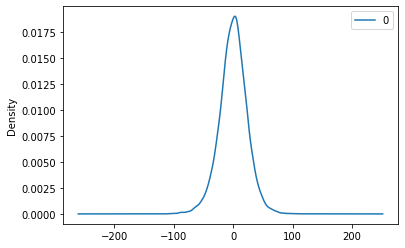

In [189]:
pd.DataFrame(mFit.resid).plot(kind='kde')

## Prophet model building
- guide for installation and use [here](https://facebook.github.io/prophet/docs/quick_start.html#python-api)
- a little background on mechanism [here](https://towardsdatascience.com/a-quick-start-of-time-series-forecasting-with-a-practical-example-using-fb-prophet-31c4447a2274)

In [244]:
temp2=pd.DataFrame({'ds':temp.index, 'y':temp['TG']})

In [265]:
temp2.head()

,ds,y
DATE,,
2010-01-01,2010-01-01,-14
2010-01-02,2010-01-02,-17
2010-01-03,2010-01-03,-43
2010-01-04,2010-01-04,-56
2010-01-05,2010-01-05,-60


In [245]:
temp2=temp2['2010':]

In [192]:
m=Prophet()
m.fit(temp2)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [193]:
future=m.make_future_dataframe(periods=30)

In [194]:
forecast=m.predict(future)

In [198]:
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
3798,2020-05-26,186.554470,138.470368,232.879491
3799,2020-05-27,188.402298,141.565808,237.193584
3800,2020-05-28,192.448972,148.338678,237.889940
3801,2020-05-29,194.490753,144.994111,243.937704
3802,2020-05-30,194.579162,148.685279,239.020331


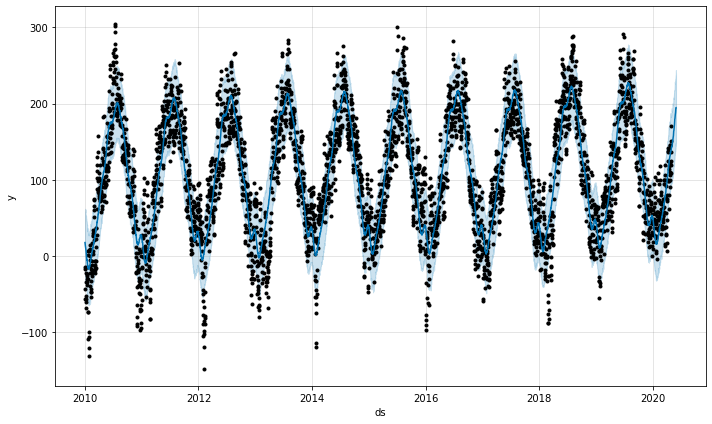

In [199]:
m.plot(forecast)
None

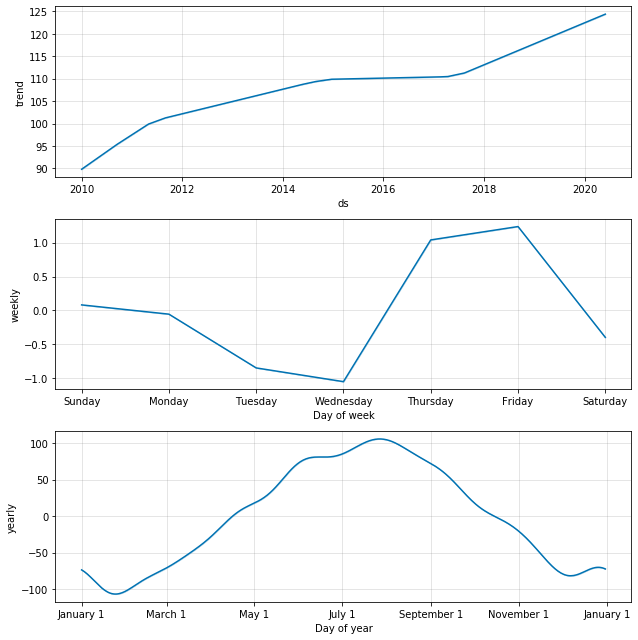

In [200]:
m.plot_components(forecast)
None

In [130]:
fig=plot_plotly(m, forecast)
py.iplot(fig)

In [201]:
temp2CV=cross_validation(m, initial='1825 days', period='180 days', horizon='365 days')

INFO:fbprophet:Making 9 forecasts with cutoffs between 2015-05-22 00:00:00 and 2019-05-01 00:00:00


In [202]:
temp2CV.head()

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2015-05-23,161.586959,114.808055,209.673386,158,2015-05-22
1,2015-05-24,164.355594,119.552299,210.935166,143,2015-05-22
2,2015-05-25,166.818558,120.968223,209.873378,165,2015-05-22
3,2015-05-26,168.723447,120.437819,217.046199,130,2015-05-22
4,2015-05-27,170.442855,122.620124,218.301000,113,2015-05-22


In [203]:
temp2P=performance_metrics(temp2CV)

INFO:fbprophet:Skipping MAPE because y close to 0


In [204]:
temp2P.sort_values(by='rmse')

,horizon,mse,rmse,mae,coverage
116,153 days,1099.558938,33.159598,25.968426,0.844851
117,154 days,1102.020984,33.196701,25.952526,0.847900
296,333 days,1103.481612,33.218694,26.252576,0.834350
295,332 days,1105.709849,33.252216,26.242300,0.832995
118,155 days,1107.346744,33.276820,26.202391,0.844851
...,...,...,...,...,...
153,190 days,1743.177024,41.751372,34.462728,0.693767
327,364 days,1743.681587,41.757414,34.257124,0.716802
152,189 days,1754.416937,41.885761,34.546894,0.692412
150,187 days,1759.551442,41.947008,34.757677,0.692073


In [226]:
forecast2=forecast.set_index('ds')

In [258]:
ytest=temp2['y'][-30:]
ypred=forecast2['yhat']['20200401':'20200430']

In [259]:
print(f'model RMSE: {np.sqrt(mean_squared_log_error(ytest,ypred))}')

model RMSE: 0.26226578386828114
